# **Homework2 - Denoising Diffusion Probabilistic Model**

This is the sample code of homework 2 of the IMVFX course by Prof. I-Chen Lin

In this section, you are required to build a diffusion network for image generation.

If you have any questions, please contact the TA via 1999joehuang@gmail.com

Sample code for DDPM, include the structure and train function. You can start form this file or write your own structure and train function. You can also modify anything in this file for training.

What you need to do:

1. Load MNIST dataset.
2. Train the DDPM and generate images in 5*5 grid.
3. Plot the loss of DDPM.
4. Load the anime face dataset.
5. Design the DDPM process for the anime face dataset and perform the same steps as in step 2 & 3.

For more details, please reference to DDPMPractice.pdf.

If you are not familiar with Colab, [here](https://colab.research.google.com/drive/1GYNIgctFaYsxyuK2RqfRda1M0Qk-jhvL#scrollTo=enB7U8b9Z1WA) provide the basic Colab knowledge needed to finish this homework.

# Set up the environment



### Packages Installation

In [1]:
# You may replace the workspace directory if you want
workspace_dir = '.'

# Library for handling tensor operations
!pip install einops

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.6/44.6 kB 1.4 MB/s eta 0:00:00


### Download the dataset

Download dataset via **gdown**.

You need to download the MNIST dataset and the Anime Face dataset.

Or you can download datasets from google drive <br/> MNIST dataset: https://drive.google.com/file/d/16j8CG2FxVIUGpn4ZmocCl_wNj9VGv6FM/view?usp=drive_link <br/> Anime Face dataset: https://drive.google.com/file/d/1UOJ-C_TQxsTdN0SaH2uhQ4rEOh43qnTJ/view?usp=drive_link

In [2]:
# MNIST dataset
!gdown --id 16j8CG2FxVIUGpn4ZmocCl_wNj9VGv6FM --output "{workspace_dir}/mnist.zip"

# Anime Face dataset
!gdown --id 1UOJ-C_TQxsTdN0SaH2uhQ4rEOh43qnTJ --output "{workspace_dir}/anime_face.zip"

/usr/local/lib/python3.10/dist-packages/gdown/cli.py:121: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: https://drive.google.com/uc?id=16j8CG2FxVIUGpn4ZmocCl_wNj9VGv6FM
To: /content/mnist.zip
100% 42.6M/42.6M [00:00<00:00, 224MB/s]
/usr/local/lib/python3.10/dist-packages/gdown/cli.py:121: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: https://drive.google.com/uc?id=1UOJ-C_TQxsTdN0SaH2uhQ4rEOh43qnTJ
To: /content/anime_face.zip
100% 229M/229M [00:01<00:00, 166MB/s]


###Unzip the downloaded file.


The unzipped tree structure is like:
```
mnist_dataset/
  data/
    0/
    ├── 1.jpg
    ├── 21.jpg
    ├── 34.jpg
    ├── ...
    ...
```

```
anime_face_dataset/
  data/
  ├── 1.png
  ├── 2.png
  ├── 3.png
  ├── ...
```

In [3]:
!unzip -o -q "{workspace_dir}/mnist.zip" -d "{workspace_dir}/mnist_dataset"
!unzip -o -q "{workspace_dir}/anime_face.zip" -d "{workspace_dir}/anime_face_dataset"

# Random seed

Set the random seed to a certain value for reproducibility.

In [9]:
import random

import torch
import numpy as np

def same_seeds(seed):
  # Python built-in random module
  random.seed(seed)
  # Numpy
  np.random.seed(seed)
  # Torch
  torch.manual_seed(seed)
  if torch.cuda.is_available():
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
  torch.backends.cudnn.benchmark = False
  torch.backends.cudnn.deterministic = True

# Set random seed for reproducibility
same_seeds(999)

# Import packages

First, we need to import packages that will be used later.

In [10]:
# Import packages
import numpy as np
import cv2
import einops
import imageio
import matplotlib.pyplot as plt
from tqdm.auto import tqdm
import torch
import torch.nn as nn
from torch.optim import Adam
from torch.utils.data import DataLoader
import torchvision
from torchvision.transforms import Compose, ToTensor, Lambda, Grayscale
from torchvision.datasets import ImageFolder

# Hyperparameters and Initialization

Define some inputs for the run later.

In [11]:
# Root directory for the MNIST dataset
dataset_path = f"{workspace_dir}/mnist_dataset"

# The path to save the model
model_store_path = f"{workspace_dir}/mnist.pt"

# Batch size during training
batch_size = 128

# Number of training epochs
n_epochs = 50

# Learning rate for optimizers
lr = 0.001

# Number of the forward steps
n_steps = 1000

# Initial beta
start_beta = 1e-4

# End beta
end_beta = 0.02

# Getting device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Device: {device}")

# List to keep track of loss
loss_list = []

Device: cuda


# Dataset

### Create the dataset and data loader.

In [12]:
# Load the data, convert it to grayscale, and then normalize it to the range of [-1, 1]
dataset = ImageFolder(root=dataset_path, transform=Compose([
    Grayscale(),
    ToTensor(),
    Lambda(lambda x: (x - 0.5) * 2)]
))

# Make the data loader
dataloader = DataLoader(dataset, batch_size, shuffle=True)

### Show some images

The shape of images:  (128, 1, 28, 28)


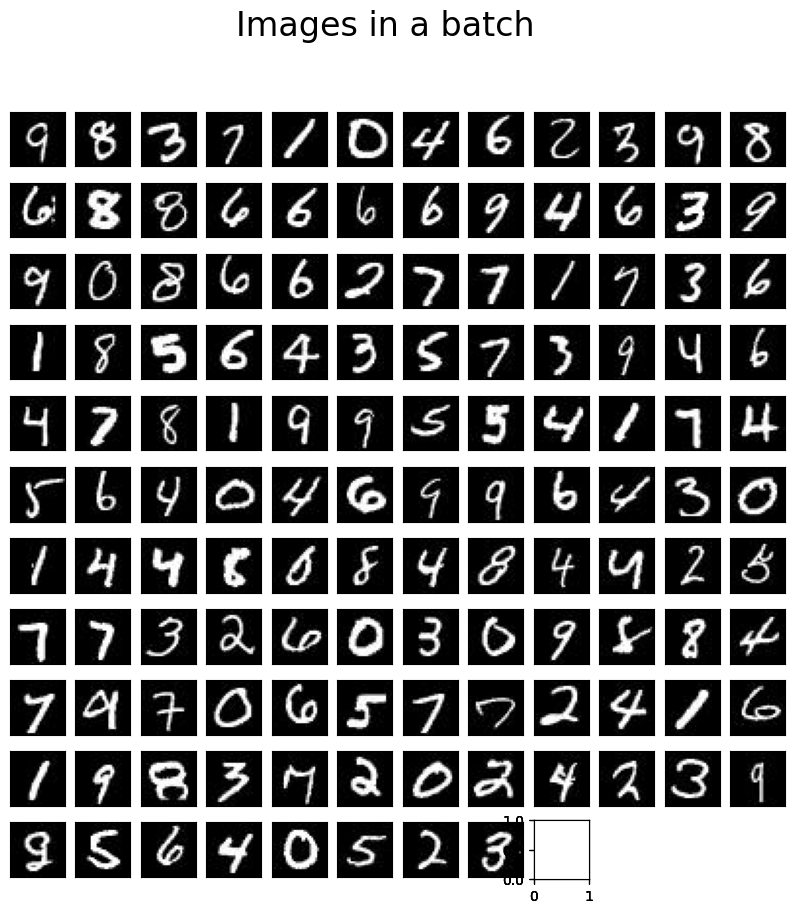

In [13]:
# Show images
def show_images(images, title=""):
    if type(images) is torch.Tensor:
        images = images.detach().cpu().numpy()
    print("The shape of images: ", images.shape)
    fig = plt.figure(figsize=(10, 10))
    fig.suptitle(title, fontsize=24)
    rows = int(len(images) ** 0.5)
    cols = round(len(images) / rows)
    index = 0
    for row in range(rows):
        for col in range(cols):
            fig.add_subplot(rows, cols, index + 1)
            if index < len(images):
                frame = plt.gca()
                frame.axes.get_yaxis().set_visible(False)
                frame.axes.get_xaxis().set_visible(False)
                temp = np.transpose(images[index], (1, 2, 0))
                plt.imshow((temp+1)/2, cmap='gray')
                index += 1
    plt.savefig("result_mnist.jpg")
    plt.show()

# Show images of next batch
def show_images_of_next_batch(loader):
    dataiter = iter(dataloader)
    data = next(dataiter)
    features, labels = data
    show_images(features, "Images in a batch")

show_images_of_next_batch(dataloader)

# Model

Here, we constructed a noise predictor using a simple U-Net architecture to generate handwritten numbers.

If you want to achieve better results, you need to design more complex models yourself.

Feel free to modify your own model structure!

### DDPM

In [ ]:
# Define the class of DDPM
class DDPM(nn.Module):
    def __init__(self, image_shape=(1, 28, 28), n_steps=200, start_beta=1e-4, end_beta=0.02, device=None):
        super(DDPM, self).__init__()
        self.device = device
        self.image_shape = image_shape
        self.n_steps = n_steps
        self.noise_predictor = UNet(n_steps).to(device)
        self.betas = torch.linspace(start_beta, end_beta, n_steps).to(device)
        self.alphas = 1 - self.betas
        self.alpha_bars = torch.tensor([torch.prod(self.alphas[:i + 1]) for i in range(len(self.alphas))]).to(device)

    # Forward process
    # Add the noise to the images
    def forward(self, x0, t, eta=None):
        n, channel, height, width = x0.shape
        alpha_bar = self.alpha_bars[t]

        if eta is None:
            eta = torch.randn(n, channel, height, width).to(self.device)

        noise = alpha_bar.sqrt().reshape(n, 1, 1, 1) * x0 + (1 - alpha_bar).sqrt().reshape(n, 1, 1, 1) * eta
        return noise

    # Backward process
    # Predict the noise that was added to the images during the forward process
    def backward(self, x, t):
        return self.noise_predictor(x, t)

### Time embedding

In [ ]:
# Create the time embedding
def time_embedding(n, d):
    embedding = torch.zeros(n, d)
    wk = torch.tensor([1 / 10000 ** (2 * j / d) for j in range(d)])
    wk = wk.reshape((1, d))
    t = torch.arange(n).reshape((n, 1))
    embedding[:,::2] = torch.sin(t * wk[:,::2])
    embedding[:,1::2] = torch.cos(t * wk[:,::2])
    return embedding

### Noise predictor

In [ ]:
# Define the class of U-Net
class UNet(nn.Module):
    def __init__(self, n_steps=1000, time_embedding_dim=256):
        super(UNet, self).__init__()

        # Time embedding
        self.time_step_embedding = nn.Embedding(n_steps, time_embedding_dim)
        self.time_step_embedding.weight.data = time_embedding(n_steps, time_embedding_dim)
        self.time_step_embedding.requires_grad_(False)

        # The first half
        self.time_step_encoder1 = nn.Sequential(
            nn.Linear(time_embedding_dim, 1),
            nn.SiLU(),
            nn.Linear(1, 1)
        )

        self.block1 = nn.Sequential(
            nn.LayerNorm((1, 28, 28)),
            nn.Conv2d(1, 8, kernel_size=3, stride=1, padding=1),
            nn.Conv2d(8, 8, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2),
        )
        self.down1 = nn.Conv2d(8, 8, 4, 2, 1)

        self.time_step_encoder2 = nn.Sequential(
            nn.Linear(time_embedding_dim, 8),
            nn.SiLU(),
            nn.Linear(8, 8)
        )

        self.block2 = nn.Sequential(
            nn.LayerNorm((8, 14, 14)),
            nn.Conv2d(8, 16, kernel_size=3, stride=1, padding=1),
            nn.Conv2d(16, 16, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2),
        )
        self.down2 = nn.Conv2d(16, 16, 4, 2, 1)

        self.time_step_encoder3 = nn.Sequential(
            nn.Linear(time_embedding_dim, 16),
            nn.SiLU(),
            nn.Linear(16, 16)
        )

        self.block3 = nn.Sequential(
            nn.LayerNorm((16, 7, 7)),
            nn.Conv2d(16, 32, kernel_size=3, stride=1, padding=1),
            nn.Conv2d(32, 32, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2),
        )
        self.down3 = nn.Sequential(
            nn.Conv2d(32, 32, 2, 1),
            nn.LeakyReLU(0.2),
            nn.Conv2d(32, 32, 4, 2, 1)
        )

        # The bottleneck
        self.time_step_encoder_mid = nn.Sequential(
            nn.Linear(time_embedding_dim, 32),
            nn.SiLU(),
            nn.Linear(32, 32)
        )

        self.block_mid = nn.Sequential(
            nn.LayerNorm((32, 3, 3)),
            nn.Conv2d(32, 32, kernel_size=3, stride=1, padding=1),
            nn.Conv2d(32, 32, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2),
        )

        # The second half
        self.up1 = nn.Sequential(
            nn.ConvTranspose2d(32, 32, kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(0.2),
            nn.ConvTranspose2d(32, 32, 2, 1)
        )

        self.time_step_encoder4 = nn.Sequential(
            nn.Linear(time_embedding_dim, 64),
            nn.SiLU(),
            nn.Linear(64, 64)
        )

        self.block4 = nn.Sequential(
            nn.LayerNorm((64, 7, 7)),
            nn.Conv2d(64, 16, kernel_size=3, stride=1, padding=1),
            nn.Conv2d(16, 16, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2),
        )

        self.up2 = nn.ConvTranspose2d(16, 16, 4, 2, 1)

        self.time_step_encoder5 = nn.Sequential(
            nn.Linear(time_embedding_dim, 32),
            nn.SiLU(),
            nn.Linear(32, 32)
        )

        self.block5 = nn.Sequential(
            nn.LayerNorm((32, 14, 14)),
            nn.Conv2d(32, 8, kernel_size=3, stride=1, padding=1),
            nn.Conv2d(8, 8, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2),
        )

        self.up3 = nn.ConvTranspose2d(8, 8, 4, 2, 1)

        self.time_step_encoder6 = nn.Sequential(
            nn.Linear(time_embedding_dim, 16),
            nn.SiLU(),
            nn.Linear(16, 16)
        )
        self.block6 = nn.Sequential(
            nn.LayerNorm((16, 28, 28)),
            nn.Conv2d(16, 8, kernel_size=3, stride=1, padding=1),
            nn.Conv2d(8, 8, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2),
            nn.LayerNorm((8, 28, 28)),
            nn.Conv2d(8, 8, kernel_size=3, stride=1, padding=1),
            nn.Conv2d(8, 8, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2),
        )

        self.final_layer = nn.Conv2d(8, 1, 3, 1, 1)

    def forward(self, x, t):
        t = self.time_step_embedding(t)
        n = len(x)
        output1 = self.block1(x + self.time_step_encoder1(t).reshape(n, -1, 1, 1))
        output2 = self.block2(self.down1(output1) + self.time_step_encoder2(t).reshape(n, -1, 1, 1))
        output3 = self.block3(self.down2(output2) + self.time_step_encoder3(t).reshape(n, -1, 1, 1))
        output_mid = self.block_mid(self.down3(output3) + self.time_step_encoder_mid(t).reshape(n, -1, 1, 1))
        output4 = torch.cat((output3, self.up1(output_mid)), dim=1)
        output4 = self.block4(output4 + self.time_step_encoder4(t).reshape(n, -1, 1, 1))
        output5 = torch.cat((output2, self.up2(output4)), dim=1)
        output5 = self.block5(output5 + self.time_step_encoder5(t).reshape(n, -1, 1, 1))
        output6 = torch.cat((output1, self.up3(output5)), dim=1)
        output6 = self.block6(output6 + self.time_step_encoder6(t).reshape(n, -1, 1, 1))
        output = self.final_layer(output6)
        return output

# Train

### Initialization

In [ ]:
# Build the DDPM
ddpm_mnist = DDPM(n_steps=n_steps, start_beta=start_beta, end_beta=end_beta, device=device)

# Print the model
print(ddpm_mnist)

DDPM(
  (noise_predictor): UNet(
    (time_step_embedding): Embedding(1000, 256)
    (time_step_encoder1): Sequential(
      (0): Linear(in_features=256, out_features=1, bias=True)
      (1): SiLU()
      (2): Linear(in_features=1, out_features=1, bias=True)
    )
    (block1): Sequential(
      (0): LayerNorm((1, 28, 28), eps=1e-05, elementwise_affine=True)
      (1): Conv2d(1, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (2): Conv2d(8, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (3): LeakyReLU(negative_slope=0.2)
    )
    (down1): Conv2d(8, 8, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (time_step_encoder2): Sequential(
      (0): Linear(in_features=256, out_features=8, bias=True)
      (1): SiLU()
      (2): Linear(in_features=8, out_features=8, bias=True)
    )
    (block2): Sequential(
      (0): LayerNorm((8, 14, 14), eps=1e-05, elementwise_affine=True)
      (1): Conv2d(8, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (2)

### Show forward process

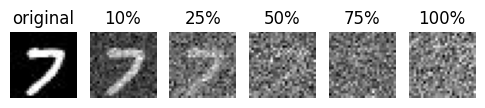

In [ ]:
# Sample the first image from the next batch, then demonstrate the forward process.
def show_forward(ddpm, loader, device):
    fig = plt.figure(figsize=(6, 1))

    for batch in loader:

        images = batch[0]
        fig.add_subplot(161)
        temp = np.transpose(images[0], (1, 2, 0))
        plt.title('original')
        plt.imshow((temp+1)/2, cmap='gray')
        plt.axis('off')

        tensor_image = ddpm(images[:1].to(device), [int(0.1 * ddpm.n_steps) - 1])
        image = tensor_image.detach().cpu().numpy()
        fig.add_subplot(162)
        temp = np.transpose(image[0], (1, 2, 0))
        plt.title('10%')
        plt.imshow((temp+1)/2, cmap='gray')
        plt.axis('off')

        tensor_image = ddpm(images[:1].to(device), [int(0.25 * ddpm.n_steps) - 1])
        image = tensor_image.detach().cpu().numpy()
        fig.add_subplot(163)
        temp = np.transpose(image[0], (1, 2, 0))
        plt.title('25%')
        plt.imshow((temp+1)/2, cmap='gray')
        plt.axis('off')

        tensor_image = ddpm(images[:1].to(device), [int(0.5 * ddpm.n_steps) - 1])
        image = tensor_image.detach().cpu().numpy()
        fig.add_subplot(164)
        temp = np.transpose(image[0], (1, 2, 0))
        plt.title('50%')
        plt.imshow((temp+1)/2, cmap='gray')
        plt.axis('off')

        tensor_image = ddpm(images[:1].to(device), [int(0.75 * ddpm.n_steps) - 1])
        image = tensor_image.detach().cpu().numpy()
        fig.add_subplot(165)
        temp = np.transpose(image[0], (1, 2, 0))
        plt.title('75%')
        plt.imshow((temp+1)/2, cmap='gray')
        plt.axis('off')

        tensor_image = ddpm(images[:1].to(device), [int(1 * ddpm.n_steps) - 1])
        image = tensor_image.detach().cpu().numpy()
        fig.add_subplot(166)
        temp = np.transpose(image[0], (1, 2, 0))
        plt.title('100%')
        plt.imshow((temp+1)/2, cmap='gray')
        plt.axis('off')
        break

show_forward(ddpm_mnist, dataloader, device)

### Generate new images

In [ ]:
"""
Provided with a DDPM model, a specified number of samples to generate, and a chosen device,
this function returns a set of freshly generated samples while also saving the .gif of the reverse process
"""
def generate_new_images(ddpm, n_samples=16, device=None, frames_per_gif=25, gif_name="sampling.gif", channel=1, height=28, width=28):
    frame_idxs = np.linspace(0, ddpm.n_steps, frames_per_gif).astype(np.uint)
    frames = []

    with torch.no_grad():
        if device is None:
            device = ddpm.device

        # Starting from random noise
        x = torch.randn(n_samples, channel, height, width).to(device)

        for idx, t in enumerate(list(range(ddpm.n_steps))[::-1]):
            # Estimating noise to be removed
            time_tensor = (torch.ones(n_samples, 1) * t).to(device).long()
            eta_theta = ddpm.backward(x, time_tensor)

            alpha_t = ddpm.alphas[t]
            alpha_t_bar = ddpm.alpha_bars[t]

            # Partially denoising the image
            x = (1 / alpha_t.sqrt()) * (x - (1 - alpha_t) / (1 - alpha_t_bar).sqrt() * eta_theta)

            if t > 0:
                z = torch.randn(n_samples, channel, height, width).to(device)
                beta_t = ddpm.betas[t]
                sigma_t = beta_t.sqrt()
                x = x + sigma_t * z

            # Adding frames to the GIF
            if idx in frame_idxs or t == 0:
                # Putting digits in range [0, 255]
                normalized = x.clone()
                for i in range(len(normalized)):
                    normalized[i] -= torch.min(normalized[i])
                    normalized[i] *= 255 / torch.max(normalized[i])

                # Reshaping batch (n, c, h, w) to be a square frame
                frame = einops.rearrange(normalized, "(b1 b2) c h w -> (b1 h) (b2 w) c", b1=int(n_samples ** 0.5))
                frame = frame.cpu().numpy().astype(np.uint8)

                # Rendering frame
                frames.append(frame)


    for i in range(len(frames)):
        frames[i] = cv2.cvtColor(frames[i], cv2.COLOR_GRAY2RGB)

    # Storing the gif
    with imageio.get_writer(gif_name, mode="I") as writer:
        for idx, frame in enumerate(frames):
            writer.append_data(frame)
            if idx == len(frames) - 1:
                for _ in range(frames_per_gif // 3):
                    writer.append_data(frames[-1])
    return x



### Training loop

In [ ]:
def trainer(ddpm, dataloader, n_epochs, optim, loss_funciton, device, model_store_path):

    best_loss = float("inf")
    n_steps = ddpm.n_steps

    for epoch in tqdm(range(n_epochs), desc=f"Training progress", colour="green"):
        epoch_loss = 0.0
        for step, batch in enumerate(tqdm(dataloader, leave=False, desc=f"Epoch {epoch + 1}/{n_epochs}", colour="blue")):
            # Load data
            x0 = batch[0].to(device)
            n = len(x0)

            # Pick random noise for each of the images in the batch
            eta = torch.randn_like(x0).to(device)
            t = torch.randint(0, n_steps, (n,)).to(device)

            # Compute the noisy image based on x0 and the time step
            noises = ddpm(x0, t, eta)

            # Get model estimation of noise based on the images and the time step
            eta_theta = ddpm.backward(noises, t.reshape(n, -1))

            # Optimize the Mean Squared Error (MSE) between the injected noise and the predicted noise
            loss = loss_funciton(eta_theta, eta)

            # First, initialize the optimizer's gradient and then update the network's weights
            optim.zero_grad()
            loss.backward()
            optim.step()

            # Aggregate the loss values from each iteration to compute the loss value for an epoch
            epoch_loss += loss.item() * len(x0) / len(dataloader.dataset)

            # Save Losses for plotting later
            loss_list.append(loss.item())

        log_string = f"Loss at epoch {epoch + 1}: {epoch_loss:.3f}"

        # Show images generated at the epoch
        if epoch % 10 == 0:
          show_images(generate_new_images(ddpm, device=device), f"Images generated at epoch {epoch + 1}")

        # If the current loss is better than the previous one, then store the model
        if best_loss > epoch_loss:
            best_loss = epoch_loss
            torch.save(ddpm.state_dict(), model_store_path)
            log_string += " <Store the best model.>"

        print(log_string)

Training progress:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 1/50:   0%|          | 0/469 [00:00<?, ?it/s]

The shape of images:  (16, 1, 28, 28)


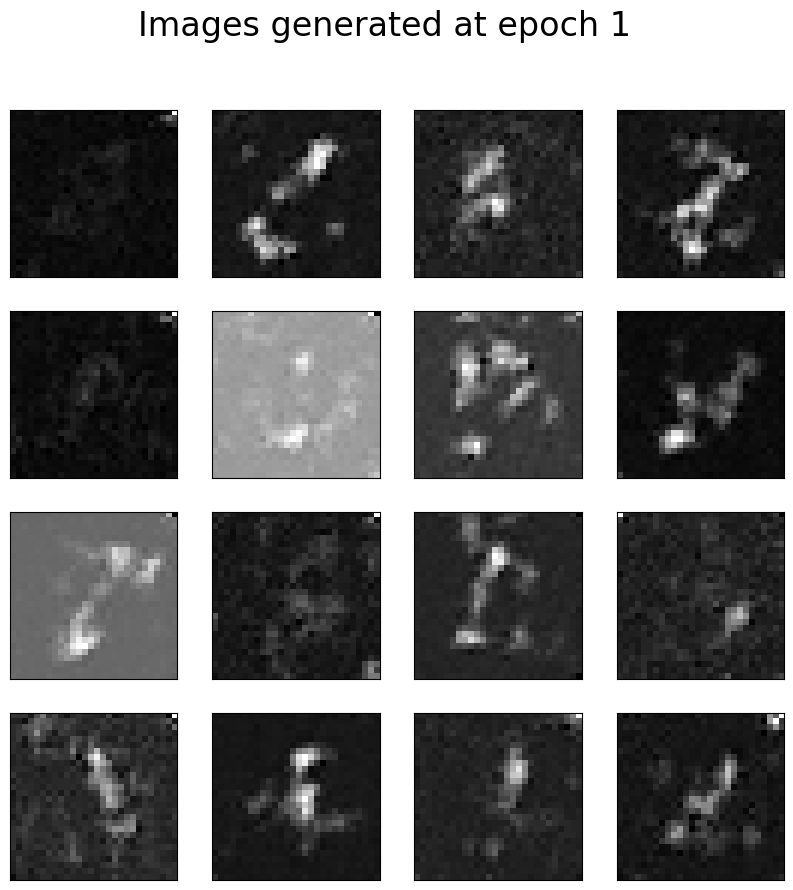

Loss at epoch 1: 0.137 <Store the best model.>


Epoch 2/50:   0%|          | 0/469 [00:00<?, ?it/s]

Loss at epoch 2: 0.060 <Store the best model.>


Epoch 3/50:   0%|          | 0/469 [00:00<?, ?it/s]

Loss at epoch 3: 0.053 <Store the best model.>


Epoch 4/50:   0%|          | 0/469 [00:00<?, ?it/s]

Loss at epoch 4: 0.050 <Store the best model.>


Epoch 5/50:   0%|          | 0/469 [00:00<?, ?it/s]

Loss at epoch 5: 0.047 <Store the best model.>


Epoch 6/50:   0%|          | 0/469 [00:00<?, ?it/s]

Loss at epoch 6: 0.045 <Store the best model.>


Epoch 7/50:   0%|          | 0/469 [00:00<?, ?it/s]

Loss at epoch 7: 0.043 <Store the best model.>


Epoch 8/50:   0%|          | 0/469 [00:00<?, ?it/s]

Loss at epoch 8: 0.043 <Store the best model.>


Epoch 9/50:   0%|          | 0/469 [00:00<?, ?it/s]

Loss at epoch 9: 0.041 <Store the best model.>


Epoch 10/50:   0%|          | 0/469 [00:00<?, ?it/s]

Loss at epoch 10: 0.041 <Store the best model.>


Epoch 11/50:   0%|          | 0/469 [00:00<?, ?it/s]

The shape of images:  (16, 1, 28, 28)


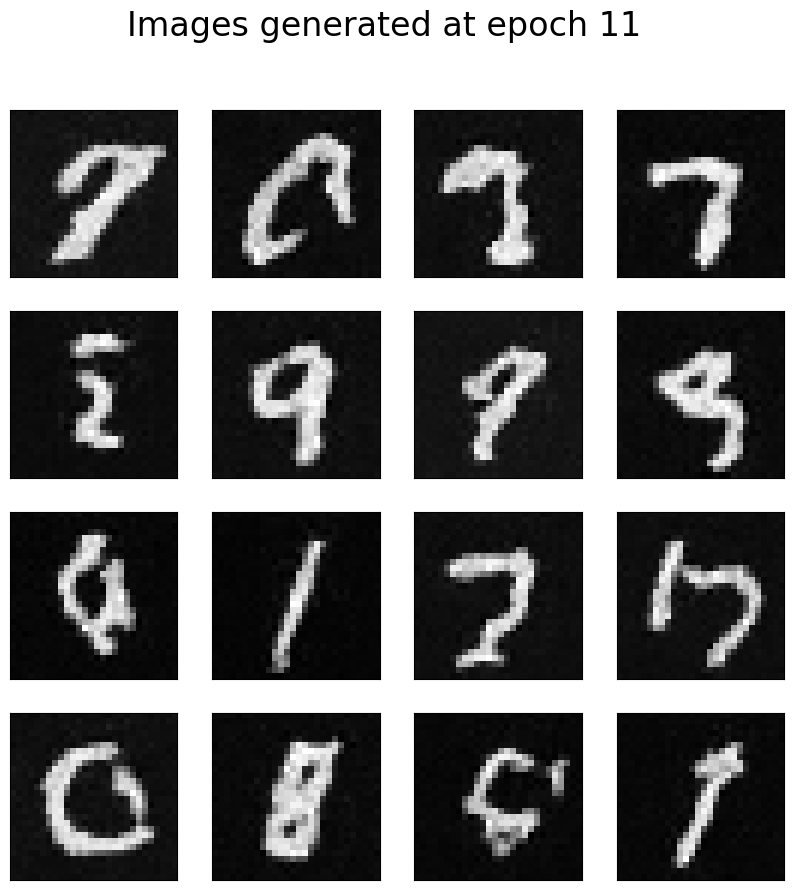

Loss at epoch 11: 0.040 <Store the best model.>


Epoch 12/50:   0%|          | 0/469 [00:00<?, ?it/s]

Loss at epoch 12: 0.040 <Store the best model.>


Epoch 13/50:   0%|          | 0/469 [00:00<?, ?it/s]

Loss at epoch 13: 0.040


Epoch 14/50:   0%|          | 0/469 [00:00<?, ?it/s]

Loss at epoch 14: 0.038 <Store the best model.>


Epoch 15/50:   0%|          | 0/469 [00:00<?, ?it/s]

Loss at epoch 15: 0.039


Epoch 16/50:   0%|          | 0/469 [00:00<?, ?it/s]

Loss at epoch 16: 0.038 <Store the best model.>


Epoch 17/50:   0%|          | 0/469 [00:00<?, ?it/s]

Loss at epoch 17: 0.038


Epoch 18/50:   0%|          | 0/469 [00:00<?, ?it/s]

Loss at epoch 18: 0.038 <Store the best model.>


Epoch 19/50:   0%|          | 0/469 [00:00<?, ?it/s]

Loss at epoch 19: 0.038


Epoch 20/50:   0%|          | 0/469 [00:00<?, ?it/s]

Loss at epoch 20: 0.038


Epoch 21/50:   0%|          | 0/469 [00:00<?, ?it/s]

The shape of images:  (16, 1, 28, 28)


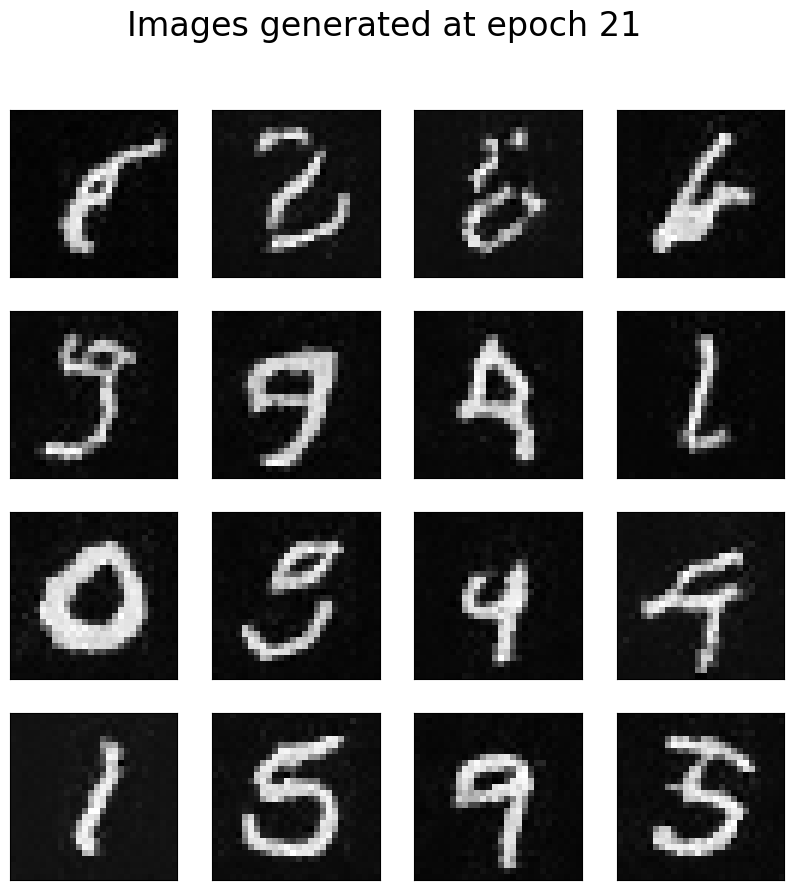

Loss at epoch 21: 0.038


Epoch 22/50:   0%|          | 0/469 [00:00<?, ?it/s]

Loss at epoch 22: 0.037 <Store the best model.>


Epoch 23/50:   0%|          | 0/469 [00:00<?, ?it/s]

Loss at epoch 23: 0.038


Epoch 24/50:   0%|          | 0/469 [00:00<?, ?it/s]

Loss at epoch 24: 0.037 <Store the best model.>


Epoch 25/50:   0%|          | 0/469 [00:00<?, ?it/s]

Loss at epoch 25: 0.037


Epoch 26/50:   0%|          | 0/469 [00:00<?, ?it/s]

Loss at epoch 26: 0.037 <Store the best model.>


Epoch 27/50:   0%|          | 0/469 [00:00<?, ?it/s]

Loss at epoch 27: 0.037 <Store the best model.>


Epoch 28/50:   0%|          | 0/469 [00:00<?, ?it/s]

Loss at epoch 28: 0.037


Epoch 29/50:   0%|          | 0/469 [00:00<?, ?it/s]

Loss at epoch 29: 0.037 <Store the best model.>


Epoch 30/50:   0%|          | 0/469 [00:00<?, ?it/s]

Loss at epoch 30: 0.037


Epoch 31/50:   0%|          | 0/469 [00:00<?, ?it/s]

The shape of images:  (16, 1, 28, 28)


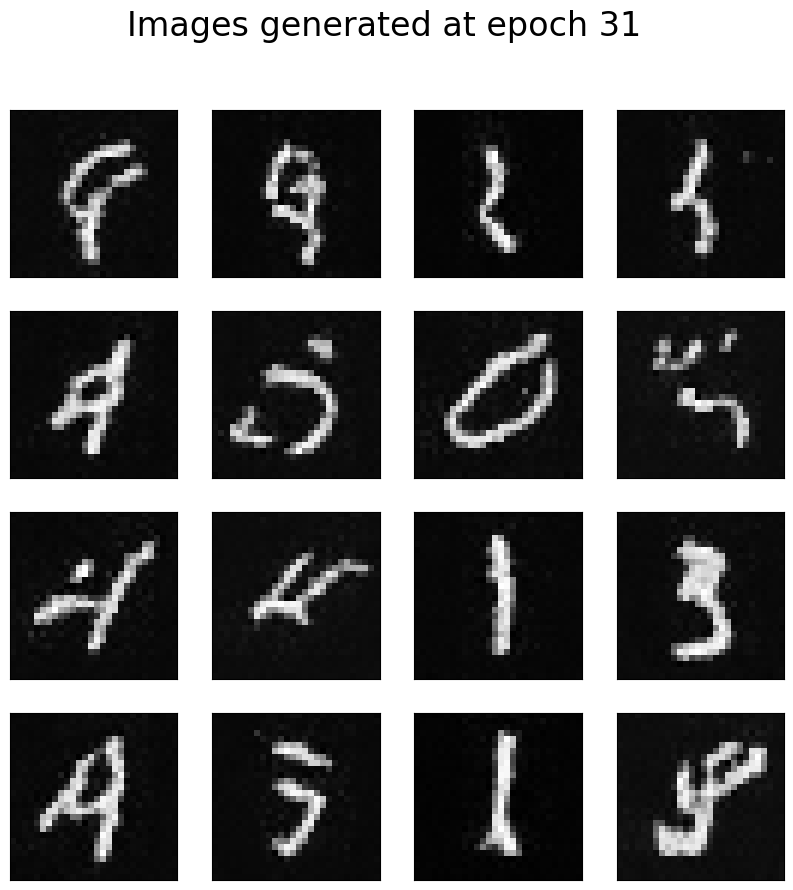

Loss at epoch 31: 0.037


Epoch 32/50:   0%|          | 0/469 [00:00<?, ?it/s]

Loss at epoch 32: 0.036 <Store the best model.>


Epoch 33/50:   0%|          | 0/469 [00:00<?, ?it/s]

Loss at epoch 33: 0.037


Epoch 34/50:   0%|          | 0/469 [00:00<?, ?it/s]

Loss at epoch 34: 0.037


Epoch 35/50:   0%|          | 0/469 [00:00<?, ?it/s]

Loss at epoch 35: 0.037


Epoch 36/50:   0%|          | 0/469 [00:00<?, ?it/s]

Loss at epoch 36: 0.036 <Store the best model.>


Epoch 37/50:   0%|          | 0/469 [00:00<?, ?it/s]

Loss at epoch 37: 0.037


Epoch 38/50:   0%|          | 0/469 [00:00<?, ?it/s]

Loss at epoch 38: 0.036


Epoch 39/50:   0%|          | 0/469 [00:00<?, ?it/s]

Loss at epoch 39: 0.036


Epoch 40/50:   0%|          | 0/469 [00:00<?, ?it/s]

Loss at epoch 40: 0.036


Epoch 41/50:   0%|          | 0/469 [00:00<?, ?it/s]

The shape of images:  (16, 1, 28, 28)


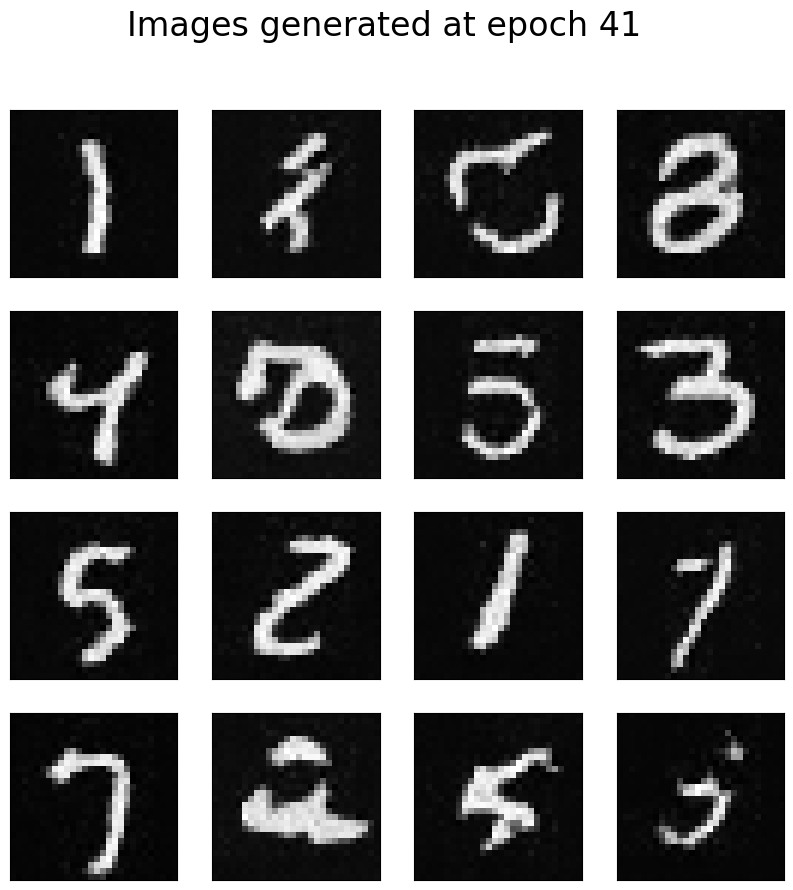

Loss at epoch 41: 0.036 <Store the best model.>


Epoch 42/50:   0%|          | 0/469 [00:00<?, ?it/s]

Loss at epoch 42: 0.036


Epoch 43/50:   0%|          | 0/469 [00:00<?, ?it/s]

Loss at epoch 43: 0.036 <Store the best model.>


Epoch 44/50:   0%|          | 0/469 [00:00<?, ?it/s]

Loss at epoch 44: 0.036


Epoch 45/50:   0%|          | 0/469 [00:00<?, ?it/s]

Loss at epoch 45: 0.036


Epoch 46/50:   0%|          | 0/469 [00:00<?, ?it/s]

Loss at epoch 46: 0.036


Epoch 47/50:   0%|          | 0/469 [00:00<?, ?it/s]

Loss at epoch 47: 0.036


Epoch 48/50:   0%|          | 0/469 [00:00<?, ?it/s]

Loss at epoch 48: 0.035 <Store the best model.>


Epoch 49/50:   0%|          | 0/469 [00:00<?, ?it/s]

Loss at epoch 49: 0.036


Epoch 50/50:   0%|          | 0/469 [00:00<?, ?it/s]

Loss at epoch 50: 0.036


In [ ]:
trainer(ddpm_mnist, dataloader, n_epochs=n_epochs, optim=Adam(ddpm_mnist.parameters(), lr), loss_funciton=nn.MSELoss(), device=device, model_store_path=model_store_path)

# Generation

### Load the trained model

In [ ]:
# Build the model
ddpm_mnist = DDPM(n_steps=n_steps, device=device)

# Load the state of the trained model
ddpm_mnist.load_state_dict(torch.load(model_store_path, map_location=device))

# Change to evaluation mode
ddpm_mnist.eval()

DDPM(
  (noise_predictor): UNet(
    (time_step_embedding): Embedding(1000, 256)
    (time_step_encoder1): Sequential(
      (0): Linear(in_features=256, out_features=1, bias=True)
      (1): SiLU()
      (2): Linear(in_features=1, out_features=1, bias=True)
    )
    (block1): Sequential(
      (0): LayerNorm((1, 28, 28), eps=1e-05, elementwise_affine=True)
      (1): Conv2d(1, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (2): Conv2d(8, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (3): LeakyReLU(negative_slope=0.2)
    )
    (down1): Conv2d(8, 8, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (time_step_encoder2): Sequential(
      (0): Linear(in_features=256, out_features=8, bias=True)
      (1): SiLU()
      (2): Linear(in_features=8, out_features=8, bias=True)
    )
    (block2): Sequential(
      (0): LayerNorm((8, 14, 14), eps=1e-05, elementwise_affine=True)
      (1): Conv2d(8, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (2)

### Generate images

The shape of images:  (100, 1, 28, 28)


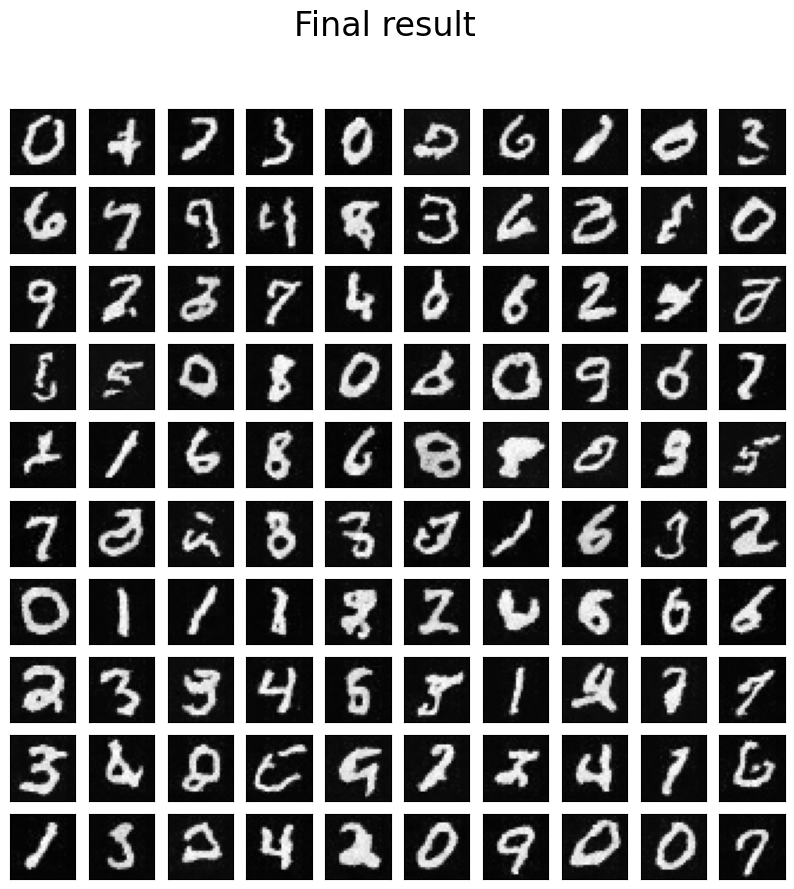

In [ ]:
images = generate_new_images(
        ddpm_mnist,
        n_samples=100,
        device=device,
        gif_name="mnist.gif"
    )
show_images(images, "Final result")

### Show the GIF

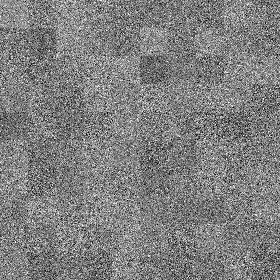

In [ ]:
from IPython.display import Image

Image(open('mnist.gif','rb').read())

# Plot loss values

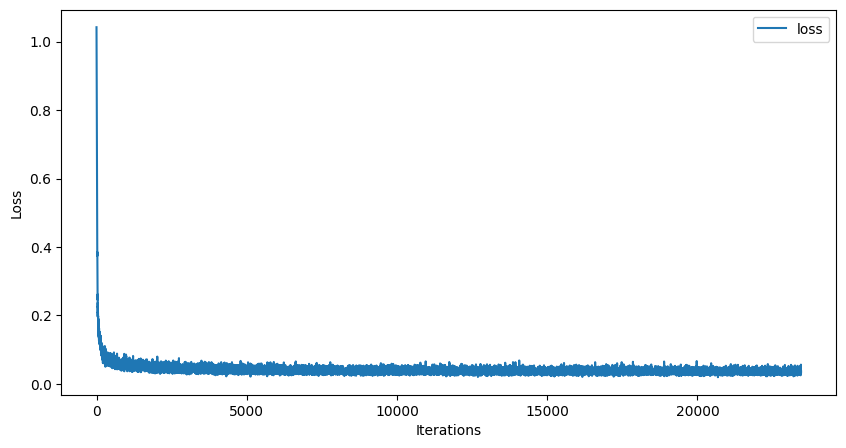

In [ ]:
######################################################################################
# TODO: Plot the loss values of DDPM for the MNIST dataset
# Implementation B.1-2
######################################################################################
plt.figure(figsize=(10,5))
plt.plot(loss_list,label="loss")
plt.xlabel("Iterations")
plt.ylabel("Loss")
plt.legend()
plt.savefig("loss.jpg")
plt.show()

# Plot generated images in 5*5 grid

The shape of images:  (25, 1, 28, 28)


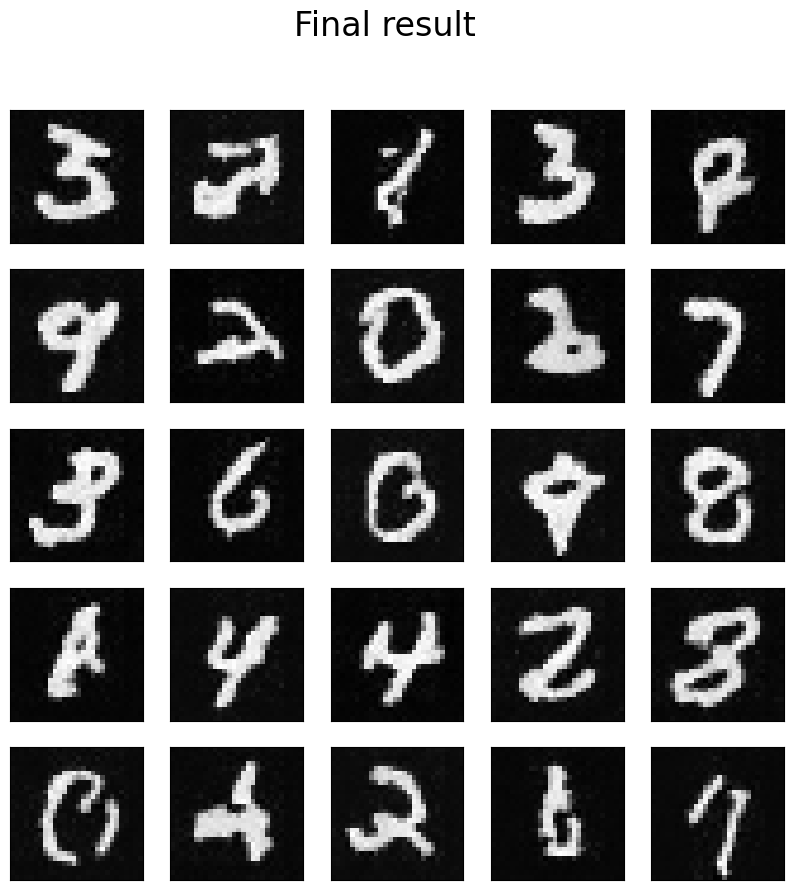

In [ ]:
######################################################################################
# TODO: Store your generate images in 5*5 grid for the MNIST dataset
# Implementation B.1-3
######################################################################################
images = generate_new_images(
        ddpm_mnist,
        n_samples=25,
        device=device,
        gif_name="mnist.gif"
    )
show_images(images, "Final result")

# It's your turn

You need to train the diffusion model to generate grayscale images or color ones by the Anime Face dataset.

If you choose to implement the color images generation model, you will get additional bonus.

Please note that the size of the input images should be 64x64.



In [5]:
!pip install diffusers[training]



     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 18.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 265.7/265.7 kB 31.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 521.2/521.2 kB 47.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.3/115.3 kB 16.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 18.3 MB/s eta 0:00:00


In [6]:
from dataclasses import dataclass


@dataclass
class TrainingConfig:
    image_size = 64  # the generated image resolution
    train_batch_size = 64
    eval_batch_size = 16  # how many images to sample during evaluation
    num_epochs = 50
    gradient_accumulation_steps = 1
    learning_rate = 1e-4
    lr_warmup_steps = 500
    save_image_epochs = 10
    save_model_epochs = 10
    mixed_precision = "fp16"  # `no` for float32, `fp16` for automatic mixed precision
    output_dir = "anime_face"  # the model name locally and on the HF Hub
    push_to_hub = False
    hub_private_repo = False
    overwrite_output_dir = True  # overwrite the old model when re-running the notebook
    seed = 0


config = TrainingConfig()

In [8]:
from datasets import load_dataset

dataset = load_dataset("imagefolder", data_dir=f"{workspace_dir}/anime_face_dataset/data", split="train")

Resolving data files:   0%|          | 0/21376 [00:00<?, ?it/s]

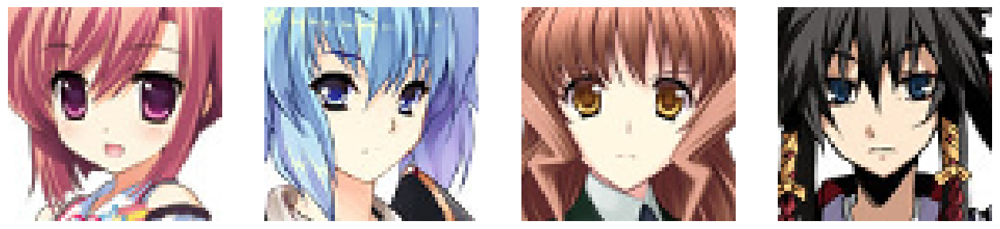

In [9]:
import matplotlib.pyplot as plt

fig, axs = plt.subplots(1, 4, figsize=(16, 4))
for i, image in enumerate(dataset[:4]["image"]):
    axs[i].imshow(image)
    axs[i].set_axis_off()
fig.show()

In [10]:
from torchvision import transforms

preprocess = transforms.Compose(
    [
        transforms.Resize((config.image_size, config.image_size)),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize([0.5], [0.5]),
    ]
)

In [11]:
def transform(examples):
    images = [preprocess(image.convert("RGB")) for image in examples["image"]]
    return {"images": images}


dataset.set_transform(transform)

In [12]:
import torch

train_dataloader = torch.utils.data.DataLoader(dataset, batch_size=config.train_batch_size, shuffle=True)

In [13]:
from diffusers import UNet2DModel

model = UNet2DModel(
    sample_size=config.image_size,  # the target image resolution
    in_channels=3,  # the number of input channels, 3 for RGB images
    out_channels=3,  # the number of output channels
    layers_per_block=2,  # how many ResNet layers to use per UNet block
    block_out_channels=(128, 128, 256, 256, 512, 512),  # the number of output channels for each UNet block
    down_block_types=(
        "DownBlock2D",  # a regular ResNet downsampling block
        "DownBlock2D",
        "DownBlock2D",
        "DownBlock2D",
        "AttnDownBlock2D",  # a ResNet downsampling block with spatial self-attention
        "DownBlock2D",
    ),
    up_block_types=(
        "UpBlock2D",  # a regular ResNet upsampling block
        "AttnUpBlock2D",  # a ResNet upsampling block with spatial self-attention
        "UpBlock2D",
        "UpBlock2D",
        "UpBlock2D",
        "UpBlock2D",
    ),
)

In [14]:
sample_image = dataset[0]["images"].unsqueeze(0)
print("Input shape:", sample_image.shape)

print("Output shape:", model(sample_image, timestep=0).sample.shape)

Input shape: torch.Size([1, 3, 64, 64])
Output shape: torch.Size([1, 3, 64, 64])


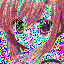

In [15]:
import torch
from PIL import Image
from diffusers import DDPMScheduler

noise_scheduler = DDPMScheduler(num_train_timesteps=1000)
noise = torch.randn(sample_image.shape)
timesteps = torch.LongTensor([50])
noisy_image = noise_scheduler.add_noise(sample_image, noise, timesteps)

Image.fromarray(((noisy_image.permute(0, 2, 3, 1) + 1.0) * 127.5).type(torch.uint8).numpy()[0])

In [16]:
import torch.nn.functional as F

noise_pred = model(noisy_image, timesteps).sample
loss = F.mse_loss(noise_pred, noise)

In [17]:
from diffusers.optimization import get_cosine_schedule_with_warmup

optimizer = torch.optim.AdamW(model.parameters(), lr=config.learning_rate)
lr_scheduler = get_cosine_schedule_with_warmup(
    optimizer=optimizer,
    num_warmup_steps=config.lr_warmup_steps,
    num_training_steps=(len(train_dataloader) * config.num_epochs),
)

In [18]:
from diffusers import DDPMPipeline
from diffusers.utils import make_image_grid
import os

def evaluate(config, epoch, pipeline):
    # Sample some images from random noise (this is the backward diffusion process).
    # The default pipeline output type is `List[PIL.Image]`
    images = pipeline(
        batch_size=config.eval_batch_size,
        generator=torch.manual_seed(config.seed),
    ).images

    # Make a grid out of the images
    image_grid = make_image_grid(images, rows=4, cols=4)

    # Save the images
    test_dir = os.path.join(config.output_dir, "samples")
    os.makedirs(test_dir, exist_ok=True)
    image_grid.save(f"{test_dir}/{epoch:04d}.png")

In [28]:
from accelerate import Accelerator
from huggingface_hub import create_repo, upload_folder
from tqdm.auto import tqdm
from pathlib import Path
import os

loss_list = []
def train_loop(config, model, noise_scheduler, optimizer, train_dataloader, lr_scheduler):
    # Initialize accelerator and tensorboard logging
    accelerator = Accelerator(
        mixed_precision=config.mixed_precision,
        gradient_accumulation_steps=config.gradient_accumulation_steps,
        log_with="tensorboard",
        project_dir=os.path.join(config.output_dir, "logs"),
    )
    if accelerator.is_main_process:
        if config.output_dir is not None:
            os.makedirs(config.output_dir, exist_ok=True)
        if config.push_to_hub:
            repo_id = create_repo(
                repo_id=config.hub_model_id or Path(config.output_dir).name, exist_ok=True
            ).repo_id
        accelerator.init_trackers("train_example")

    # Prepare everything
    # There is no specific order to remember, you just need to unpack the
    # objects in the same order you gave them to the prepare method.
    model, optimizer, train_dataloader, lr_scheduler = accelerator.prepare(
        model, optimizer, train_dataloader, lr_scheduler
    )

    global_step = 0
    # Now you train the model
    for epoch in range(config.num_epochs):
        progress_bar = tqdm(total=len(train_dataloader), disable=not accelerator.is_local_main_process)
        progress_bar.set_description(f"Epoch {epoch}")

        for step, batch in enumerate(train_dataloader):
            clean_images = batch["images"]
            # Sample noise to add to the images
            noise = torch.randn(clean_images.shape, device=clean_images.device)
            bs = clean_images.shape[0]

            # Sample a random timestep for each image
            timesteps = torch.randint(
                0, noise_scheduler.config.num_train_timesteps, (bs,), device=clean_images.device,
                dtype=torch.int64
            )

            # Add noise to the clean images according to the noise magnitude at each timestep
            # (this is the forward diffusion process)
            noisy_images = noise_scheduler.add_noise(clean_images, noise, timesteps)

            with accelerator.accumulate(model):
                # Predict the noise residual
                noise_pred = model(noisy_images, timesteps, return_dict=False)[0]
                loss = F.mse_loss(noise_pred, noise)
                loss_list.append(loss.detach().item())
                accelerator.backward(loss)

                accelerator.clip_grad_norm_(model.parameters(), 1.0)
                optimizer.step()
                lr_scheduler.step()
                optimizer.zero_grad()

            progress_bar.update(1)
            logs = {"loss": loss.detach().item(), "lr": lr_scheduler.get_last_lr()[0], "step": global_step}
            progress_bar.set_postfix(**logs)
            accelerator.log(logs, step=global_step)
            global_step += 1

        # After each epoch you optionally sample some demo images with evaluate() and save the model
        if accelerator.is_main_process:
            pipeline = DDPMPipeline(unet=accelerator.unwrap_model(model), scheduler=noise_scheduler)

            if (epoch + 1) % config.save_image_epochs == 0 or epoch == config.num_epochs - 1:
                evaluate(config, epoch, pipeline)

            if (epoch + 1) % config.save_model_epochs == 0 or epoch == config.num_epochs - 1:
                if config.push_to_hub:
                    upload_folder(
                        repo_id=repo_id,
                        folder_path=config.output_dir,
                        commit_message=f"Epoch {epoch}",
                        ignore_patterns=["step_*", "epoch_*"],
                    )
                else:
                    pipeline.save_pretrained(config.output_dir)

In [29]:
from accelerate import notebook_launcher

args = (config, model, noise_scheduler, optimizer, train_dataloader, lr_scheduler)

notebook_launcher(train_loop, args, num_processes=1)

Launching training on one GPU.


  0%|          | 0/334 [00:00<?, ?it/s]

  0%|          | 0/334 [00:00<?, ?it/s]

  0%|          | 0/334 [00:00<?, ?it/s]

  0%|          | 0/334 [00:00<?, ?it/s]

  0%|          | 0/334 [00:00<?, ?it/s]

  0%|          | 0/334 [00:00<?, ?it/s]

  0%|          | 0/334 [00:00<?, ?it/s]

  0%|          | 0/334 [00:00<?, ?it/s]

  0%|          | 0/334 [00:00<?, ?it/s]

  0%|          | 0/334 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/334 [00:00<?, ?it/s]

  0%|          | 0/334 [00:00<?, ?it/s]

  0%|          | 0/334 [00:00<?, ?it/s]

  0%|          | 0/334 [00:00<?, ?it/s]

  0%|          | 0/334 [00:00<?, ?it/s]

  0%|          | 0/334 [00:00<?, ?it/s]

  0%|          | 0/334 [00:00<?, ?it/s]

  0%|          | 0/334 [00:00<?, ?it/s]

  0%|          | 0/334 [00:00<?, ?it/s]

  0%|          | 0/334 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/334 [00:00<?, ?it/s]

  0%|          | 0/334 [00:00<?, ?it/s]

  0%|          | 0/334 [00:00<?, ?it/s]

  0%|          | 0/334 [00:00<?, ?it/s]

  0%|          | 0/334 [00:00<?, ?it/s]

  0%|          | 0/334 [00:00<?, ?it/s]

  0%|          | 0/334 [00:00<?, ?it/s]

  0%|          | 0/334 [00:00<?, ?it/s]

  0%|          | 0/334 [00:00<?, ?it/s]

  0%|          | 0/334 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/334 [00:00<?, ?it/s]

  0%|          | 0/334 [00:00<?, ?it/s]

  0%|          | 0/334 [00:00<?, ?it/s]

  0%|          | 0/334 [00:00<?, ?it/s]

  0%|          | 0/334 [00:00<?, ?it/s]

  0%|          | 0/334 [00:00<?, ?it/s]

  0%|          | 0/334 [00:00<?, ?it/s]

  0%|          | 0/334 [00:00<?, ?it/s]

  0%|          | 0/334 [00:00<?, ?it/s]

  0%|          | 0/334 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/334 [00:00<?, ?it/s]

  0%|          | 0/334 [00:00<?, ?it/s]

  0%|          | 0/334 [00:00<?, ?it/s]

  0%|          | 0/334 [00:00<?, ?it/s]

  0%|          | 0/334 [00:00<?, ?it/s]

  0%|          | 0/334 [00:00<?, ?it/s]

  0%|          | 0/334 [00:00<?, ?it/s]

  0%|          | 0/334 [00:00<?, ?it/s]

  0%|          | 0/334 [00:00<?, ?it/s]

  0%|          | 0/334 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

#Plot loss values

#Plot generated images in 5*5 grid

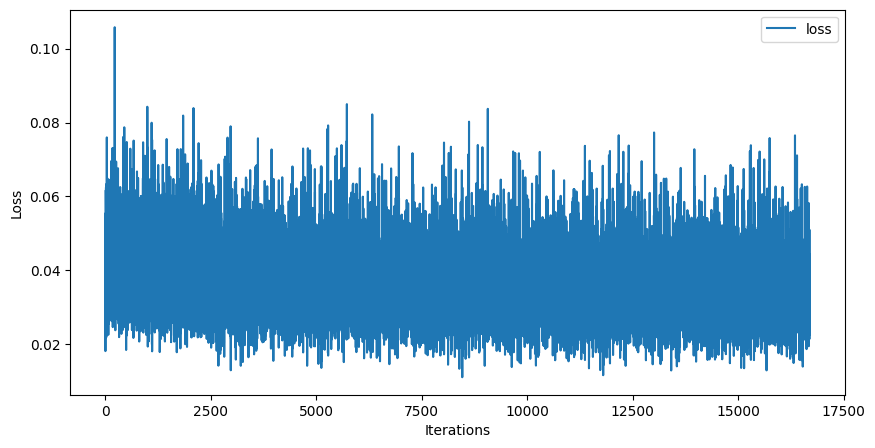

In [30]:
######################################################################################
# TODO: Plot the loss values of DDPM for the Anime Face dataset
# Implementation B.1-5
######################################################################################
plt.figure(figsize=(10,5))
plt.plot(loss_list,label="loss")
plt.xlabel("Iterations")
plt.ylabel("Loss")
plt.legend()
plt.savefig("loss_anime.jpg")
plt.show()

Loading pipeline components...:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

The shape of images:  (25, 3, 64, 64)


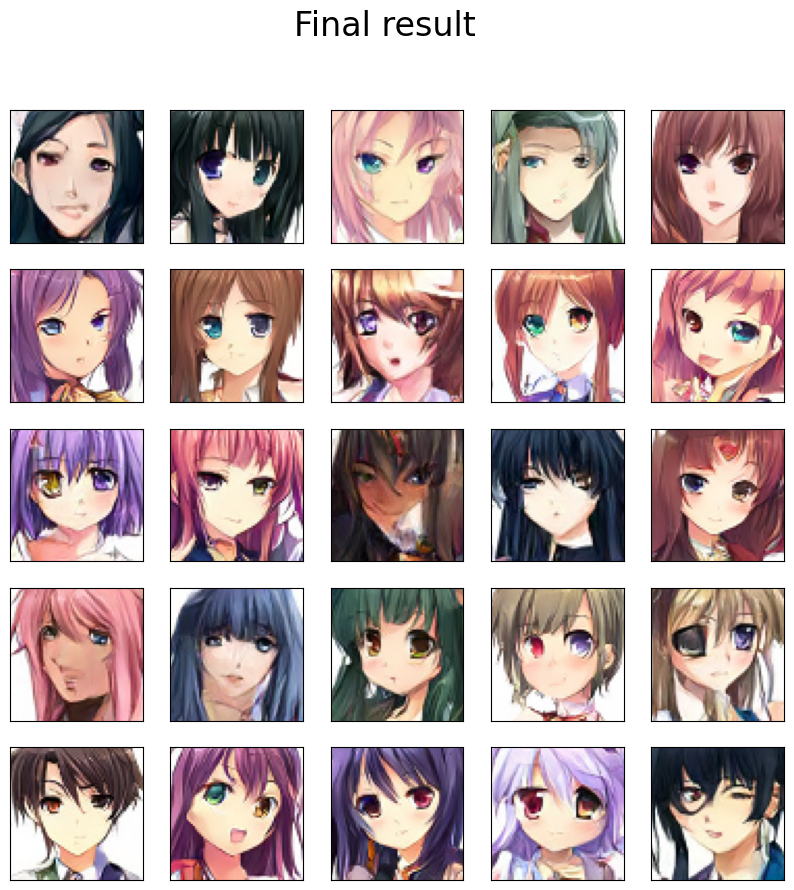

In [32]:
from diffusers import DDPMPipeline
import torchvision
import numpy as np
import torch
from torchvision import transforms
import matplotlib.pyplot as plt
def show_images(images, title=""):
    if type(images) is torch.Tensor:
        images = images.detach().cpu().numpy()
    print("The shape of images: ", images.shape)
    fig = plt.figure(figsize=(10, 10))
    fig.suptitle(title, fontsize=24)
    rows = int(len(images) ** 0.5)
    cols = round(len(images) / rows)
    index = 0
    for row in range(rows):
        for col in range(cols):
            fig.add_subplot(rows, cols, index + 1)
            if index < len(images):
                frame = plt.gca()
                frame.axes.get_yaxis().set_visible(False)
                frame.axes.get_xaxis().set_visible(False)
                temp = np.transpose(images[index], (1, 2, 0))
                plt.imshow(temp)
                index += 1
    plt.savefig("result_anime.jpg")
    plt.show()
# load model and scheduler
pipe = DDPMPipeline.from_pretrained(config.output_dir).to("cuda")

# run pipeline in inference (sample random noise and denoise)

image = pipe(batch_size=25 , num_inference_steps=1000).images
transform = transforms.ToTensor()
tensors = [transform(img) for img in image]
images_tensor = torch.stack(tensors)
show_images(images_tensor, "Final result")


In [50]:

from PIL import Image
import os
import torchvision


folder_name = "ima"
os.makedirs(folder_name)

batch_size = 20
num_batches = 500
log_dir = os.path.join(workspace_dir, 'ima')
for batch in range(num_batches):
    image = pipe(batch_size=batch_size , num_inference_steps=100).images
    transform = transforms.ToTensor()
    tensors = [transform(img) for img in image]
    images_tensor = torch.stack(tensors)
    print(batch)
    for i in range(batch_size):
        img_path = os.path.join(log_dir, f'batch{batch}_img{i}.png')
        torchvision.utils.save_image(images_tensor[i], img_path, format='png')

  0%|          | 0/100 [00:00<?, ?it/s]

0


  0%|          | 0/100 [00:00<?, ?it/s]

1


  0%|          | 0/100 [00:00<?, ?it/s]

2


  0%|          | 0/100 [00:00<?, ?it/s]

3


  0%|          | 0/100 [00:00<?, ?it/s]

4


  0%|          | 0/100 [00:00<?, ?it/s]

5


  0%|          | 0/100 [00:00<?, ?it/s]

6


  0%|          | 0/100 [00:00<?, ?it/s]

7


  0%|          | 0/100 [00:00<?, ?it/s]

8


  0%|          | 0/100 [00:00<?, ?it/s]

9


  0%|          | 0/100 [00:00<?, ?it/s]

10


  0%|          | 0/100 [00:00<?, ?it/s]

11


  0%|          | 0/100 [00:00<?, ?it/s]

12


  0%|          | 0/100 [00:00<?, ?it/s]

13


  0%|          | 0/100 [00:00<?, ?it/s]

14


  0%|          | 0/100 [00:00<?, ?it/s]

15


  0%|          | 0/100 [00:00<?, ?it/s]

16


  0%|          | 0/100 [00:00<?, ?it/s]

17


  0%|          | 0/100 [00:00<?, ?it/s]

18


  0%|          | 0/100 [00:00<?, ?it/s]

19


  0%|          | 0/100 [00:00<?, ?it/s]

20


  0%|          | 0/100 [00:00<?, ?it/s]

21


  0%|          | 0/100 [00:00<?, ?it/s]

22


  0%|          | 0/100 [00:00<?, ?it/s]

23


  0%|          | 0/100 [00:00<?, ?it/s]

24


  0%|          | 0/100 [00:00<?, ?it/s]

25


  0%|          | 0/100 [00:00<?, ?it/s]

26


  0%|          | 0/100 [00:00<?, ?it/s]

27


  0%|          | 0/100 [00:00<?, ?it/s]

28


  0%|          | 0/100 [00:00<?, ?it/s]

29


  0%|          | 0/100 [00:00<?, ?it/s]

30


  0%|          | 0/100 [00:00<?, ?it/s]

31


  0%|          | 0/100 [00:00<?, ?it/s]

32


  0%|          | 0/100 [00:00<?, ?it/s]

33


  0%|          | 0/100 [00:00<?, ?it/s]

34


  0%|          | 0/100 [00:00<?, ?it/s]

35


  0%|          | 0/100 [00:00<?, ?it/s]

36


  0%|          | 0/100 [00:00<?, ?it/s]

37


  0%|          | 0/100 [00:00<?, ?it/s]

38


  0%|          | 0/100 [00:00<?, ?it/s]

39


  0%|          | 0/100 [00:00<?, ?it/s]

40


  0%|          | 0/100 [00:00<?, ?it/s]

41


  0%|          | 0/100 [00:00<?, ?it/s]

42


  0%|          | 0/100 [00:00<?, ?it/s]

43


  0%|          | 0/100 [00:00<?, ?it/s]

44


  0%|          | 0/100 [00:00<?, ?it/s]

45


  0%|          | 0/100 [00:00<?, ?it/s]

46


  0%|          | 0/100 [00:00<?, ?it/s]

47


  0%|          | 0/100 [00:00<?, ?it/s]

48


  0%|          | 0/100 [00:00<?, ?it/s]

49


  0%|          | 0/100 [00:00<?, ?it/s]

50


  0%|          | 0/100 [00:00<?, ?it/s]

51


  0%|          | 0/100 [00:00<?, ?it/s]

52


  0%|          | 0/100 [00:00<?, ?it/s]

53


  0%|          | 0/100 [00:00<?, ?it/s]

54


  0%|          | 0/100 [00:00<?, ?it/s]

55


  0%|          | 0/100 [00:00<?, ?it/s]

56


  0%|          | 0/100 [00:00<?, ?it/s]

57


  0%|          | 0/100 [00:00<?, ?it/s]

58


  0%|          | 0/100 [00:00<?, ?it/s]

59


  0%|          | 0/100 [00:00<?, ?it/s]

60


  0%|          | 0/100 [00:00<?, ?it/s]

61


  0%|          | 0/100 [00:00<?, ?it/s]

62


  0%|          | 0/100 [00:00<?, ?it/s]

63


  0%|          | 0/100 [00:00<?, ?it/s]

64


  0%|          | 0/100 [00:00<?, ?it/s]

65


  0%|          | 0/100 [00:00<?, ?it/s]

66


  0%|          | 0/100 [00:00<?, ?it/s]

67


  0%|          | 0/100 [00:00<?, ?it/s]

68


  0%|          | 0/100 [00:00<?, ?it/s]

69


  0%|          | 0/100 [00:00<?, ?it/s]

70


  0%|          | 0/100 [00:00<?, ?it/s]

71


  0%|          | 0/100 [00:00<?, ?it/s]

72


  0%|          | 0/100 [00:00<?, ?it/s]

73


  0%|          | 0/100 [00:00<?, ?it/s]

74


  0%|          | 0/100 [00:00<?, ?it/s]

75


  0%|          | 0/100 [00:00<?, ?it/s]

76


  0%|          | 0/100 [00:00<?, ?it/s]

77


  0%|          | 0/100 [00:00<?, ?it/s]

78


  0%|          | 0/100 [00:00<?, ?it/s]

79


  0%|          | 0/100 [00:00<?, ?it/s]

80


  0%|          | 0/100 [00:00<?, ?it/s]

81


  0%|          | 0/100 [00:00<?, ?it/s]

82


  0%|          | 0/100 [00:00<?, ?it/s]

83


  0%|          | 0/100 [00:00<?, ?it/s]

84


  0%|          | 0/100 [00:00<?, ?it/s]

85


  0%|          | 0/100 [00:00<?, ?it/s]

86


  0%|          | 0/100 [00:00<?, ?it/s]

87


  0%|          | 0/100 [00:00<?, ?it/s]

88


  0%|          | 0/100 [00:00<?, ?it/s]

89


  0%|          | 0/100 [00:00<?, ?it/s]

90


  0%|          | 0/100 [00:00<?, ?it/s]

91


  0%|          | 0/100 [00:00<?, ?it/s]

92


  0%|          | 0/100 [00:00<?, ?it/s]

93


  0%|          | 0/100 [00:00<?, ?it/s]

94


  0%|          | 0/100 [00:00<?, ?it/s]

95


  0%|          | 0/100 [00:00<?, ?it/s]

96


  0%|          | 0/100 [00:00<?, ?it/s]

97


  0%|          | 0/100 [00:00<?, ?it/s]

98


  0%|          | 0/100 [00:00<?, ?it/s]

99


  0%|          | 0/100 [00:00<?, ?it/s]

100


  0%|          | 0/100 [00:00<?, ?it/s]

101


  0%|          | 0/100 [00:00<?, ?it/s]

102


  0%|          | 0/100 [00:00<?, ?it/s]

103


  0%|          | 0/100 [00:00<?, ?it/s]

104


  0%|          | 0/100 [00:00<?, ?it/s]

105


  0%|          | 0/100 [00:00<?, ?it/s]

106


  0%|          | 0/100 [00:00<?, ?it/s]

107


  0%|          | 0/100 [00:00<?, ?it/s]

108


  0%|          | 0/100 [00:00<?, ?it/s]

109


  0%|          | 0/100 [00:00<?, ?it/s]

110


  0%|          | 0/100 [00:00<?, ?it/s]

111


  0%|          | 0/100 [00:00<?, ?it/s]

112


  0%|          | 0/100 [00:00<?, ?it/s]

113


  0%|          | 0/100 [00:00<?, ?it/s]

114


  0%|          | 0/100 [00:00<?, ?it/s]

115


  0%|          | 0/100 [00:00<?, ?it/s]

116


  0%|          | 0/100 [00:00<?, ?it/s]

117


  0%|          | 0/100 [00:00<?, ?it/s]

118


  0%|          | 0/100 [00:00<?, ?it/s]

119


  0%|          | 0/100 [00:00<?, ?it/s]

120


  0%|          | 0/100 [00:00<?, ?it/s]

121


  0%|          | 0/100 [00:00<?, ?it/s]

122


  0%|          | 0/100 [00:00<?, ?it/s]

123


  0%|          | 0/100 [00:00<?, ?it/s]

124


  0%|          | 0/100 [00:00<?, ?it/s]

125


  0%|          | 0/100 [00:00<?, ?it/s]

126


  0%|          | 0/100 [00:00<?, ?it/s]

127


  0%|          | 0/100 [00:00<?, ?it/s]

128


  0%|          | 0/100 [00:00<?, ?it/s]

129


  0%|          | 0/100 [00:00<?, ?it/s]

130


  0%|          | 0/100 [00:00<?, ?it/s]

131


  0%|          | 0/100 [00:00<?, ?it/s]

132


  0%|          | 0/100 [00:00<?, ?it/s]

133


  0%|          | 0/100 [00:00<?, ?it/s]

134


  0%|          | 0/100 [00:00<?, ?it/s]

135


  0%|          | 0/100 [00:00<?, ?it/s]

136


  0%|          | 0/100 [00:00<?, ?it/s]

137


  0%|          | 0/100 [00:00<?, ?it/s]

138


  0%|          | 0/100 [00:00<?, ?it/s]

139


  0%|          | 0/100 [00:00<?, ?it/s]

140


  0%|          | 0/100 [00:00<?, ?it/s]

141


  0%|          | 0/100 [00:00<?, ?it/s]

142


  0%|          | 0/100 [00:00<?, ?it/s]

143


  0%|          | 0/100 [00:00<?, ?it/s]

144


  0%|          | 0/100 [00:00<?, ?it/s]

145


  0%|          | 0/100 [00:00<?, ?it/s]

146


  0%|          | 0/100 [00:00<?, ?it/s]

147


  0%|          | 0/100 [00:00<?, ?it/s]

148


  0%|          | 0/100 [00:00<?, ?it/s]

149


  0%|          | 0/100 [00:00<?, ?it/s]

150


  0%|          | 0/100 [00:00<?, ?it/s]

151


  0%|          | 0/100 [00:00<?, ?it/s]

152


  0%|          | 0/100 [00:00<?, ?it/s]

153


  0%|          | 0/100 [00:00<?, ?it/s]

154


  0%|          | 0/100 [00:00<?, ?it/s]

155


  0%|          | 0/100 [00:00<?, ?it/s]

156


  0%|          | 0/100 [00:00<?, ?it/s]

157


  0%|          | 0/100 [00:00<?, ?it/s]

158


  0%|          | 0/100 [00:00<?, ?it/s]

159


  0%|          | 0/100 [00:00<?, ?it/s]

160


  0%|          | 0/100 [00:00<?, ?it/s]

161


  0%|          | 0/100 [00:00<?, ?it/s]

162


  0%|          | 0/100 [00:00<?, ?it/s]

163


  0%|          | 0/100 [00:00<?, ?it/s]

164


  0%|          | 0/100 [00:00<?, ?it/s]

165


  0%|          | 0/100 [00:00<?, ?it/s]

166


  0%|          | 0/100 [00:00<?, ?it/s]

167


  0%|          | 0/100 [00:00<?, ?it/s]

168


  0%|          | 0/100 [00:00<?, ?it/s]

169


  0%|          | 0/100 [00:00<?, ?it/s]

170


  0%|          | 0/100 [00:00<?, ?it/s]

171


  0%|          | 0/100 [00:00<?, ?it/s]

172


  0%|          | 0/100 [00:00<?, ?it/s]

173


  0%|          | 0/100 [00:00<?, ?it/s]

174


  0%|          | 0/100 [00:00<?, ?it/s]

175


  0%|          | 0/100 [00:00<?, ?it/s]

176


  0%|          | 0/100 [00:00<?, ?it/s]

177


  0%|          | 0/100 [00:00<?, ?it/s]

178


  0%|          | 0/100 [00:00<?, ?it/s]

179


  0%|          | 0/100 [00:00<?, ?it/s]

180


  0%|          | 0/100 [00:00<?, ?it/s]

181


  0%|          | 0/100 [00:00<?, ?it/s]

182


  0%|          | 0/100 [00:00<?, ?it/s]

183


  0%|          | 0/100 [00:00<?, ?it/s]

184


  0%|          | 0/100 [00:00<?, ?it/s]

185


  0%|          | 0/100 [00:00<?, ?it/s]

186


  0%|          | 0/100 [00:00<?, ?it/s]

187


  0%|          | 0/100 [00:00<?, ?it/s]

188


  0%|          | 0/100 [00:00<?, ?it/s]

189


  0%|          | 0/100 [00:00<?, ?it/s]

190


  0%|          | 0/100 [00:00<?, ?it/s]

191


  0%|          | 0/100 [00:00<?, ?it/s]

192


  0%|          | 0/100 [00:00<?, ?it/s]

193


  0%|          | 0/100 [00:00<?, ?it/s]

194


  0%|          | 0/100 [00:00<?, ?it/s]

195


  0%|          | 0/100 [00:00<?, ?it/s]

196


  0%|          | 0/100 [00:00<?, ?it/s]

197


  0%|          | 0/100 [00:00<?, ?it/s]

198


  0%|          | 0/100 [00:00<?, ?it/s]

199


  0%|          | 0/100 [00:00<?, ?it/s]

200


  0%|          | 0/100 [00:00<?, ?it/s]

201


  0%|          | 0/100 [00:00<?, ?it/s]

202


  0%|          | 0/100 [00:00<?, ?it/s]

203


  0%|          | 0/100 [00:00<?, ?it/s]

204


  0%|          | 0/100 [00:00<?, ?it/s]

205


  0%|          | 0/100 [00:00<?, ?it/s]

206


  0%|          | 0/100 [00:00<?, ?it/s]

207


  0%|          | 0/100 [00:00<?, ?it/s]

208


  0%|          | 0/100 [00:00<?, ?it/s]

209


  0%|          | 0/100 [00:00<?, ?it/s]

210


  0%|          | 0/100 [00:00<?, ?it/s]

211


  0%|          | 0/100 [00:00<?, ?it/s]

212


  0%|          | 0/100 [00:00<?, ?it/s]

213


  0%|          | 0/100 [00:00<?, ?it/s]

214


  0%|          | 0/100 [00:00<?, ?it/s]

215


  0%|          | 0/100 [00:00<?, ?it/s]

216


  0%|          | 0/100 [00:00<?, ?it/s]

217


  0%|          | 0/100 [00:00<?, ?it/s]

218


  0%|          | 0/100 [00:00<?, ?it/s]

219


  0%|          | 0/100 [00:00<?, ?it/s]

220


  0%|          | 0/100 [00:00<?, ?it/s]

221


  0%|          | 0/100 [00:00<?, ?it/s]

222


  0%|          | 0/100 [00:00<?, ?it/s]

223


  0%|          | 0/100 [00:00<?, ?it/s]

224


  0%|          | 0/100 [00:00<?, ?it/s]

225


  0%|          | 0/100 [00:00<?, ?it/s]

226


  0%|          | 0/100 [00:00<?, ?it/s]

227


  0%|          | 0/100 [00:00<?, ?it/s]

228


  0%|          | 0/100 [00:00<?, ?it/s]

229


  0%|          | 0/100 [00:00<?, ?it/s]

230


  0%|          | 0/100 [00:00<?, ?it/s]

231


  0%|          | 0/100 [00:00<?, ?it/s]

232


  0%|          | 0/100 [00:00<?, ?it/s]

233


  0%|          | 0/100 [00:00<?, ?it/s]

234


  0%|          | 0/100 [00:00<?, ?it/s]

235


  0%|          | 0/100 [00:00<?, ?it/s]

236


  0%|          | 0/100 [00:00<?, ?it/s]

237


  0%|          | 0/100 [00:00<?, ?it/s]

238


  0%|          | 0/100 [00:00<?, ?it/s]

239


  0%|          | 0/100 [00:00<?, ?it/s]

240


  0%|          | 0/100 [00:00<?, ?it/s]

241


  0%|          | 0/100 [00:00<?, ?it/s]

242


  0%|          | 0/100 [00:00<?, ?it/s]

243


  0%|          | 0/100 [00:00<?, ?it/s]

244


  0%|          | 0/100 [00:00<?, ?it/s]

245


  0%|          | 0/100 [00:00<?, ?it/s]

246


  0%|          | 0/100 [00:00<?, ?it/s]

247


  0%|          | 0/100 [00:00<?, ?it/s]

248


  0%|          | 0/100 [00:00<?, ?it/s]

249


  0%|          | 0/100 [00:00<?, ?it/s]

250


  0%|          | 0/100 [00:00<?, ?it/s]

251


  0%|          | 0/100 [00:00<?, ?it/s]

252


  0%|          | 0/100 [00:00<?, ?it/s]

253


  0%|          | 0/100 [00:00<?, ?it/s]

254


  0%|          | 0/100 [00:00<?, ?it/s]

255


  0%|          | 0/100 [00:00<?, ?it/s]

256


  0%|          | 0/100 [00:00<?, ?it/s]

257


  0%|          | 0/100 [00:00<?, ?it/s]

258


  0%|          | 0/100 [00:00<?, ?it/s]

259


  0%|          | 0/100 [00:00<?, ?it/s]

260


  0%|          | 0/100 [00:00<?, ?it/s]

261


  0%|          | 0/100 [00:00<?, ?it/s]

262


  0%|          | 0/100 [00:00<?, ?it/s]

263


  0%|          | 0/100 [00:00<?, ?it/s]

264


  0%|          | 0/100 [00:00<?, ?it/s]

265


  0%|          | 0/100 [00:00<?, ?it/s]

266


  0%|          | 0/100 [00:00<?, ?it/s]

267


  0%|          | 0/100 [00:00<?, ?it/s]

268


  0%|          | 0/100 [00:00<?, ?it/s]

269


  0%|          | 0/100 [00:00<?, ?it/s]

270


  0%|          | 0/100 [00:00<?, ?it/s]

271


  0%|          | 0/100 [00:00<?, ?it/s]

272


  0%|          | 0/100 [00:00<?, ?it/s]

273


  0%|          | 0/100 [00:00<?, ?it/s]

274


  0%|          | 0/100 [00:00<?, ?it/s]

275


  0%|          | 0/100 [00:00<?, ?it/s]

276


  0%|          | 0/100 [00:00<?, ?it/s]

277


  0%|          | 0/100 [00:00<?, ?it/s]

278


  0%|          | 0/100 [00:00<?, ?it/s]

279


  0%|          | 0/100 [00:00<?, ?it/s]

280


  0%|          | 0/100 [00:00<?, ?it/s]

281


  0%|          | 0/100 [00:00<?, ?it/s]

282


  0%|          | 0/100 [00:00<?, ?it/s]

283


  0%|          | 0/100 [00:00<?, ?it/s]

284


  0%|          | 0/100 [00:00<?, ?it/s]

285


  0%|          | 0/100 [00:00<?, ?it/s]

286


  0%|          | 0/100 [00:00<?, ?it/s]

287


  0%|          | 0/100 [00:00<?, ?it/s]

288


  0%|          | 0/100 [00:00<?, ?it/s]

289


  0%|          | 0/100 [00:00<?, ?it/s]

290


  0%|          | 0/100 [00:00<?, ?it/s]

291


  0%|          | 0/100 [00:00<?, ?it/s]

292


  0%|          | 0/100 [00:00<?, ?it/s]

293


  0%|          | 0/100 [00:00<?, ?it/s]

294


  0%|          | 0/100 [00:00<?, ?it/s]

295


  0%|          | 0/100 [00:00<?, ?it/s]

296


  0%|          | 0/100 [00:00<?, ?it/s]

297


  0%|          | 0/100 [00:00<?, ?it/s]

298


  0%|          | 0/100 [00:00<?, ?it/s]

299


  0%|          | 0/100 [00:00<?, ?it/s]

300


  0%|          | 0/100 [00:00<?, ?it/s]

301


  0%|          | 0/100 [00:00<?, ?it/s]

302


  0%|          | 0/100 [00:00<?, ?it/s]

303


  0%|          | 0/100 [00:00<?, ?it/s]

304


  0%|          | 0/100 [00:00<?, ?it/s]

305


  0%|          | 0/100 [00:00<?, ?it/s]

306


  0%|          | 0/100 [00:00<?, ?it/s]

307


  0%|          | 0/100 [00:00<?, ?it/s]

308


  0%|          | 0/100 [00:00<?, ?it/s]

309


  0%|          | 0/100 [00:00<?, ?it/s]

310


  0%|          | 0/100 [00:00<?, ?it/s]

311


  0%|          | 0/100 [00:00<?, ?it/s]

312


  0%|          | 0/100 [00:00<?, ?it/s]

313


  0%|          | 0/100 [00:00<?, ?it/s]

314


  0%|          | 0/100 [00:00<?, ?it/s]

315


  0%|          | 0/100 [00:00<?, ?it/s]

316


  0%|          | 0/100 [00:00<?, ?it/s]

317


  0%|          | 0/100 [00:00<?, ?it/s]

318


  0%|          | 0/100 [00:00<?, ?it/s]

319


  0%|          | 0/100 [00:00<?, ?it/s]

320


  0%|          | 0/100 [00:00<?, ?it/s]

321


  0%|          | 0/100 [00:00<?, ?it/s]

322


  0%|          | 0/100 [00:00<?, ?it/s]

323


  0%|          | 0/100 [00:00<?, ?it/s]

324


  0%|          | 0/100 [00:00<?, ?it/s]

325


  0%|          | 0/100 [00:00<?, ?it/s]

326


  0%|          | 0/100 [00:00<?, ?it/s]

327


  0%|          | 0/100 [00:00<?, ?it/s]

328


  0%|          | 0/100 [00:00<?, ?it/s]

329


  0%|          | 0/100 [00:00<?, ?it/s]

330


  0%|          | 0/100 [00:00<?, ?it/s]

331


  0%|          | 0/100 [00:00<?, ?it/s]

332


  0%|          | 0/100 [00:00<?, ?it/s]

333


  0%|          | 0/100 [00:00<?, ?it/s]

334


  0%|          | 0/100 [00:00<?, ?it/s]

335


  0%|          | 0/100 [00:00<?, ?it/s]

336


  0%|          | 0/100 [00:00<?, ?it/s]

337


  0%|          | 0/100 [00:00<?, ?it/s]

338


  0%|          | 0/100 [00:00<?, ?it/s]

339


  0%|          | 0/100 [00:00<?, ?it/s]

340


  0%|          | 0/100 [00:00<?, ?it/s]

341


  0%|          | 0/100 [00:00<?, ?it/s]

342


  0%|          | 0/100 [00:00<?, ?it/s]

343


  0%|          | 0/100 [00:00<?, ?it/s]

344


  0%|          | 0/100 [00:00<?, ?it/s]

345


  0%|          | 0/100 [00:00<?, ?it/s]

346


  0%|          | 0/100 [00:00<?, ?it/s]

347


  0%|          | 0/100 [00:00<?, ?it/s]

348


  0%|          | 0/100 [00:00<?, ?it/s]

349


  0%|          | 0/100 [00:00<?, ?it/s]

350


  0%|          | 0/100 [00:00<?, ?it/s]

351


  0%|          | 0/100 [00:00<?, ?it/s]

352


  0%|          | 0/100 [00:00<?, ?it/s]

353


  0%|          | 0/100 [00:00<?, ?it/s]

354


  0%|          | 0/100 [00:00<?, ?it/s]

355


  0%|          | 0/100 [00:00<?, ?it/s]

356


  0%|          | 0/100 [00:00<?, ?it/s]

357


  0%|          | 0/100 [00:00<?, ?it/s]

358


  0%|          | 0/100 [00:00<?, ?it/s]

359


  0%|          | 0/100 [00:00<?, ?it/s]

360


  0%|          | 0/100 [00:00<?, ?it/s]

361


  0%|          | 0/100 [00:00<?, ?it/s]

362


  0%|          | 0/100 [00:00<?, ?it/s]

363


  0%|          | 0/100 [00:00<?, ?it/s]

364


  0%|          | 0/100 [00:00<?, ?it/s]

365


  0%|          | 0/100 [00:00<?, ?it/s]

366


  0%|          | 0/100 [00:00<?, ?it/s]

367


  0%|          | 0/100 [00:00<?, ?it/s]

368


  0%|          | 0/100 [00:00<?, ?it/s]

369


  0%|          | 0/100 [00:00<?, ?it/s]

370


  0%|          | 0/100 [00:00<?, ?it/s]

371


  0%|          | 0/100 [00:00<?, ?it/s]

372


  0%|          | 0/100 [00:00<?, ?it/s]

373


  0%|          | 0/100 [00:00<?, ?it/s]

374


  0%|          | 0/100 [00:00<?, ?it/s]

375


  0%|          | 0/100 [00:00<?, ?it/s]

376


  0%|          | 0/100 [00:00<?, ?it/s]

377


  0%|          | 0/100 [00:00<?, ?it/s]

378


  0%|          | 0/100 [00:00<?, ?it/s]

379


  0%|          | 0/100 [00:00<?, ?it/s]

380


  0%|          | 0/100 [00:00<?, ?it/s]

381


  0%|          | 0/100 [00:00<?, ?it/s]

382


  0%|          | 0/100 [00:00<?, ?it/s]

383


  0%|          | 0/100 [00:00<?, ?it/s]

384


  0%|          | 0/100 [00:00<?, ?it/s]

385


  0%|          | 0/100 [00:00<?, ?it/s]

386


  0%|          | 0/100 [00:00<?, ?it/s]

387


  0%|          | 0/100 [00:00<?, ?it/s]

388


  0%|          | 0/100 [00:00<?, ?it/s]

389


  0%|          | 0/100 [00:00<?, ?it/s]

390


  0%|          | 0/100 [00:00<?, ?it/s]

391


  0%|          | 0/100 [00:00<?, ?it/s]

392


  0%|          | 0/100 [00:00<?, ?it/s]

393


  0%|          | 0/100 [00:00<?, ?it/s]

394


  0%|          | 0/100 [00:00<?, ?it/s]

395


  0%|          | 0/100 [00:00<?, ?it/s]

396


  0%|          | 0/100 [00:00<?, ?it/s]

397


  0%|          | 0/100 [00:00<?, ?it/s]

398


  0%|          | 0/100 [00:00<?, ?it/s]

399


  0%|          | 0/100 [00:00<?, ?it/s]

400


  0%|          | 0/100 [00:00<?, ?it/s]

401


  0%|          | 0/100 [00:00<?, ?it/s]

402


  0%|          | 0/100 [00:00<?, ?it/s]

403


  0%|          | 0/100 [00:00<?, ?it/s]

404


  0%|          | 0/100 [00:00<?, ?it/s]

405


  0%|          | 0/100 [00:00<?, ?it/s]

406


  0%|          | 0/100 [00:00<?, ?it/s]

407


  0%|          | 0/100 [00:00<?, ?it/s]

408


  0%|          | 0/100 [00:00<?, ?it/s]

409


  0%|          | 0/100 [00:00<?, ?it/s]

410


  0%|          | 0/100 [00:00<?, ?it/s]

411


  0%|          | 0/100 [00:00<?, ?it/s]

412


  0%|          | 0/100 [00:00<?, ?it/s]

413


  0%|          | 0/100 [00:00<?, ?it/s]

414


  0%|          | 0/100 [00:00<?, ?it/s]

415


  0%|          | 0/100 [00:00<?, ?it/s]

416


  0%|          | 0/100 [00:00<?, ?it/s]

417


  0%|          | 0/100 [00:00<?, ?it/s]

418


  0%|          | 0/100 [00:00<?, ?it/s]

419


  0%|          | 0/100 [00:00<?, ?it/s]

420


  0%|          | 0/100 [00:00<?, ?it/s]

421


  0%|          | 0/100 [00:00<?, ?it/s]

422


  0%|          | 0/100 [00:00<?, ?it/s]

423


  0%|          | 0/100 [00:00<?, ?it/s]

424


  0%|          | 0/100 [00:00<?, ?it/s]

425


  0%|          | 0/100 [00:00<?, ?it/s]

426


  0%|          | 0/100 [00:00<?, ?it/s]

427


  0%|          | 0/100 [00:00<?, ?it/s]

428


  0%|          | 0/100 [00:00<?, ?it/s]

429


  0%|          | 0/100 [00:00<?, ?it/s]

430


  0%|          | 0/100 [00:00<?, ?it/s]

431


  0%|          | 0/100 [00:00<?, ?it/s]

432


  0%|          | 0/100 [00:00<?, ?it/s]

433


  0%|          | 0/100 [00:00<?, ?it/s]

434


  0%|          | 0/100 [00:00<?, ?it/s]

435


  0%|          | 0/100 [00:00<?, ?it/s]

436


  0%|          | 0/100 [00:00<?, ?it/s]

437


  0%|          | 0/100 [00:00<?, ?it/s]

438


  0%|          | 0/100 [00:00<?, ?it/s]

439


  0%|          | 0/100 [00:00<?, ?it/s]

440


  0%|          | 0/100 [00:00<?, ?it/s]

441


  0%|          | 0/100 [00:00<?, ?it/s]

442


  0%|          | 0/100 [00:00<?, ?it/s]

443


  0%|          | 0/100 [00:00<?, ?it/s]

444


  0%|          | 0/100 [00:00<?, ?it/s]

445


  0%|          | 0/100 [00:00<?, ?it/s]

446


  0%|          | 0/100 [00:00<?, ?it/s]

447


  0%|          | 0/100 [00:00<?, ?it/s]

448


  0%|          | 0/100 [00:00<?, ?it/s]

449


  0%|          | 0/100 [00:00<?, ?it/s]

450


  0%|          | 0/100 [00:00<?, ?it/s]

451


  0%|          | 0/100 [00:00<?, ?it/s]

452


  0%|          | 0/100 [00:00<?, ?it/s]

453


  0%|          | 0/100 [00:00<?, ?it/s]

454


  0%|          | 0/100 [00:00<?, ?it/s]

455


  0%|          | 0/100 [00:00<?, ?it/s]

456


  0%|          | 0/100 [00:00<?, ?it/s]

457


  0%|          | 0/100 [00:00<?, ?it/s]

458


  0%|          | 0/100 [00:00<?, ?it/s]

459


  0%|          | 0/100 [00:00<?, ?it/s]

460


  0%|          | 0/100 [00:00<?, ?it/s]

461


  0%|          | 0/100 [00:00<?, ?it/s]

462


  0%|          | 0/100 [00:00<?, ?it/s]

463


  0%|          | 0/100 [00:00<?, ?it/s]

464


  0%|          | 0/100 [00:00<?, ?it/s]

465


  0%|          | 0/100 [00:00<?, ?it/s]

466


  0%|          | 0/100 [00:00<?, ?it/s]

467


  0%|          | 0/100 [00:00<?, ?it/s]

468


  0%|          | 0/100 [00:00<?, ?it/s]

469


  0%|          | 0/100 [00:00<?, ?it/s]

470


  0%|          | 0/100 [00:00<?, ?it/s]

471


  0%|          | 0/100 [00:00<?, ?it/s]

472


  0%|          | 0/100 [00:00<?, ?it/s]

473


  0%|          | 0/100 [00:00<?, ?it/s]

474


  0%|          | 0/100 [00:00<?, ?it/s]

475


  0%|          | 0/100 [00:00<?, ?it/s]

476


  0%|          | 0/100 [00:00<?, ?it/s]

477


  0%|          | 0/100 [00:00<?, ?it/s]

478


  0%|          | 0/100 [00:00<?, ?it/s]

479


  0%|          | 0/100 [00:00<?, ?it/s]

480


  0%|          | 0/100 [00:00<?, ?it/s]

481


  0%|          | 0/100 [00:00<?, ?it/s]

482


  0%|          | 0/100 [00:00<?, ?it/s]

483


  0%|          | 0/100 [00:00<?, ?it/s]

484


  0%|          | 0/100 [00:00<?, ?it/s]

485


  0%|          | 0/100 [00:00<?, ?it/s]

486


  0%|          | 0/100 [00:00<?, ?it/s]

487


  0%|          | 0/100 [00:00<?, ?it/s]

488


  0%|          | 0/100 [00:00<?, ?it/s]

489


  0%|          | 0/100 [00:00<?, ?it/s]

490


  0%|          | 0/100 [00:00<?, ?it/s]

491


  0%|          | 0/100 [00:00<?, ?it/s]

492


  0%|          | 0/100 [00:00<?, ?it/s]

493


  0%|          | 0/100 [00:00<?, ?it/s]

494


  0%|          | 0/100 [00:00<?, ?it/s]

495


  0%|          | 0/100 [00:00<?, ?it/s]

496


  0%|          | 0/100 [00:00<?, ?it/s]

497


  0%|          | 0/100 [00:00<?, ?it/s]

498


  0%|          | 0/100 [00:00<?, ?it/s]

499


In [7]:
import shutil
import os

folder_name = "real_imags"
os.makedirs(folder_name)

source_folder = "anime_face_dataset/data"
destination_folder = 'real_imags'
count = 0
for i in range(1, 20000):
    image_filename = f'{i}.png'
    source_path = os.path.join(source_folder, image_filename)


    if os.path.exists(source_path):
        shutil.move(source_path, os.path.join(destination_folder, image_filename))
        count += 1
        if count == 10000:
            break
    else:
        continue


In [4]:
!pip install pytorch-fid

In [8]:
!python -m pytorch_fid "real_imags" "ima"

Downloading: "https://github.com/mseitzer/pytorch-fid/releases/download/fid_weights/pt_inception-2015-12-05-6726825d.pth" to /root/.cache/torch/hub/checkpoints/pt_inception-2015-12-05-6726825d.pth
100% 91.2M/91.2M [00:01<00:00, 92.1MB/s]
100% 200/200 [00:43<00:00,  4.61it/s]
100% 200/200 [00:36<00:00,  5.43it/s]
FID:  19.929999768139993
